In [1]:
#北京二手房，数据分析
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as mpl

import matplotlib.pyplot as plt
from IPython.display import display

plt.style.use("fivethirtyeight")
sns.set_style({'font.sans-serif': ['simhei', 'Arial']})
# %matplotlib inline

In [3]:
# 检查Python版本
from sys import version_info
print (version_info)
if version_info.major != 3:
    raise Exception('请使用Python 3 来完成此项目')

sys.version_info(major=3, minor=7, micro=0, releaselevel='final', serial=0)


In [4]:
# 导入链家二手房数据
lianjia_df = pd.read_csv(r'D:\MyAPP\Python\lianjia.csv')
lianjia_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23677 entries, 0 to 23676
Data columns (total 12 columns):
Direction     23677 non-null object
District      23677 non-null object
Elevator      15440 non-null object
Floor         23677 non-null int64
Garden        23677 non-null object
Id            23677 non-null int64
Layout        23677 non-null object
Price         23677 non-null float64
Region        23677 non-null object
Renovation    23677 non-null object
Size          23677 non-null float64
Year          23677 non-null int64
dtypes: float64(2), int64(3), object(7)
memory usage: 2.2+ MB


In [6]:
# 复制新 df 用于数据清洗
df = lianjia_df.copy()
df.head(2)

,Direction,District,Elevator,Floor,Garden,Id,Layout,Price,Region,Renovation,Size,Year
0,东西,灯市口,NaN,6,锡拉胡同21号院,101102647043,3室1厅,780.0,东城,精装,75.0,1988
1,南北,东单,无电梯,6,东华门大街,101102650978,2室1厅,705.0,东城,精装,60.0,1988


In [7]:
# 添加新特征(column)房屋均价
df['PerPrice'] = lianjia_df['Price']/lianjia_df['Size']
df.head(2)

,Direction,District,Elevator,Floor,Garden,Id,Layout,Price,Region,Renovation,Size,Year,PerPrice
0,东西,灯市口,NaN,6,锡拉胡同21号院,101102647043,3室1厅,780.0,东城,精装,75.0,1988,10.40
1,南北,东单,无电梯,6,东华门大街,101102650978,2室1厅,705.0,东城,精装,60.0,1988,11.75


In [8]:
# 重新摆放列位置
columns = ['Region', 'District', 'Garden', 'Layout', 'Floor', 'Year', 'Size', 'Elevator', 'Direction', 'Renovation', 'PerPrice', 'Price']
df = pd.DataFrame(df, columns = columns)
df.head(2)

,Region,District,Garden,Layout,Floor,Year,Size,Elevator,Direction,Renovation,PerPrice,Price
0,东城,灯市口,锡拉胡同21号院,3室1厅,6,1988,75.0,NaN,东西,精装,10.40,780.0
1,东城,东单,东华门大街,2室1厅,6,1988,60.0,无电梯,南北,精装,11.75,705.0


In [12]:
#移除 非常规数据
df = df[(df['Layout']!='叠拼别墅')&(df['Size']<1000)]
# 行数 -- 也可以 df.shape / df.shape(0) : 0 行数  1列数
len(df)

23656

In [13]:
# 行列数
df.shape

(23656, 12)

In [14]:
# Elevator 特征分析,电梯列没有填(isnull / NaN)
miss_value = len(df.loc[(df['Elevator'].isnull()), 'Elevator'])
print('Elevator缺失值个数为：' + str(miss_value))

Elevator缺失值个数为：8237


In [15]:
# 移除表格中可能存在的错误的值 -- 未明
df['Elevator'] = df.loc[(df['Elevator']=='有电梯') | (df['Elevator']=='无电梯'), 'Elevator']
df.head(5)

,Region,District,Garden,Layout,Floor,Year,Size,Elevator,Direction,Renovation,PerPrice,Price
0,东城,灯市口,锡拉胡同21号院,3室1厅,6,1988,75.0,NaN,东西,精装,10.400000,780.0
1,东城,东单,东华门大街,2室1厅,6,1988,60.0,无电梯,南北,精装,11.750000,705.0
2,东城,崇文门,新世界中心,3室1厅,16,1996,210.0,有电梯,南西,其他,6.666667,1400.0
3,东城,崇文门,兴隆都市馨园,1室1厅,7,2004,39.0,NaN,南,精装,10.769231,420.0
4,东城,陶然亭,中海紫御公馆,2室2厅,19,2010,90.0,有电梯,南,精装,11.088889,998.0


In [16]:
# 以楼层大于6的有电梯，小于等于6层没有电梯为标准，填补缺失值
df.loc[(df['Floor']>6) & (df['Elevator'].isnull()), 'Elevator'] == '有电梯'
df.loc[(df['Floor']<=6) & (df['Elevator'].isnull()), 'Elevator'] == '无电梯'

0        False
25       False
42       False
63       False
75       False
77       False
99       False
108      False
115      False
119      False
132      False
137      False
140      False
141      False
169      False
174      False
192      False
193      False
194      False
195      False
196      False
197      False
198      False
199      False
200      False
201      False
202      False
203      False
205      False
206      False
         ...  
23528    False
23530    False
23541    False
23543    False
23545    False
23553    False
23566    False
23573    False
23574    False
23580    False
23605    False
23627    False
23628    False
23645    False
23646    False
23647    False
23648    False
23652    False
23653    False
23657    False
23662    False
23664    False
23665    False
23667    False
23668    False
23670    False
23671    False
23673    False
23674    False
23675    False
Name: Elevator, Length: 3554, dtype: bool

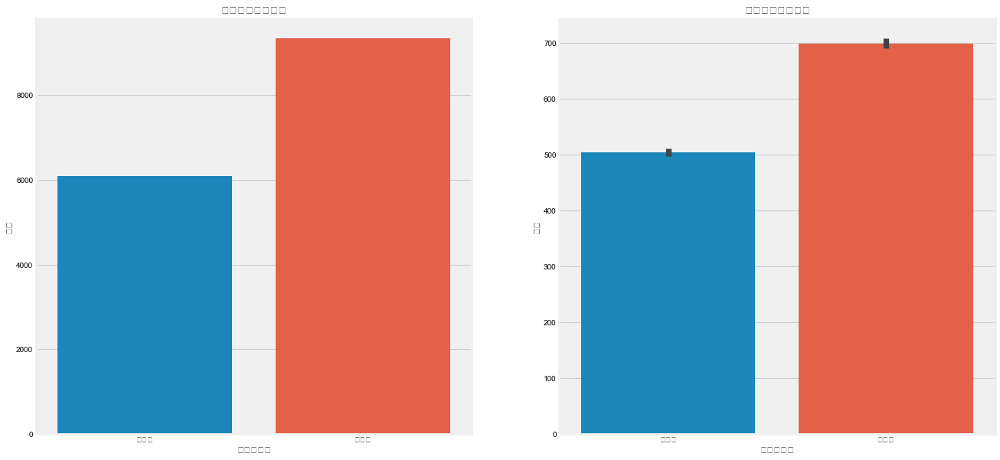

In [17]:
f, [ax1, ax2] = plt.subplots(1, 2, figsize=(20,10))
sns.countplot(df['Elevator'], ax=ax1)
ax1.set_title('有无电梯数量对比')
ax1.set_xlabel('是否有电梯')
ax1.set_ylabel('数量')

sns.barplot(x='Elevator', y='Price', data=df, ax=ax2)
ax2.set_title('有无电梯价格对比')
ax2.set_xlabel('是否有电梯')
ax2.set_ylabel('价格')
plt.show()

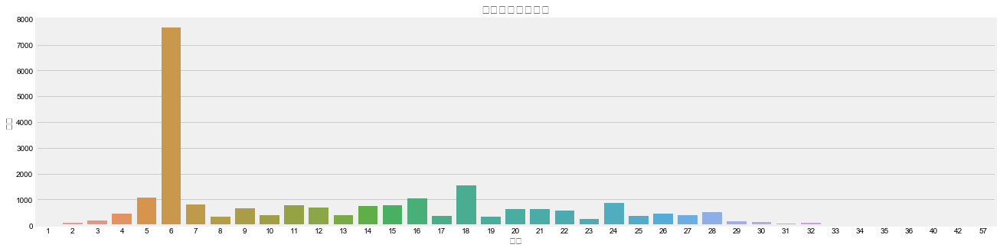

In [18]:
# Floor 特征分析
f, ax1 = plt.subplots(figsize=(20,5))
sns.countplot(df['Floor'], ax=ax1)
ax1.set_title('各楼层二手房数量', fontsize=15)
ax1.set_xlabel('楼层')
ax1.set_ylabel('数量')
plt.show()

In [22]:
df_house_count = df.groupby('Region')['Price'].count().sort_values(ascending=False).to_frame().reset_index()
df_house_mean = df.groupby('Region')['PerPrice'].mean().sort_values(ascending=False).to_frame().reset_index()
print(df_house_count)
print(df_house_mean)

Region  Price
0      海淀   2981
1      朝阳   2972
2      丰台   2951
3      昌平   2810
4      西城   2130
5      大兴   2112
6      通州   1596
7      东城   1533
8      房山   1439
9      顺义   1217
10    石景山    882
11    门头沟    496
12  亦庄开发区    469
13     平谷     41
14     怀柔     15
15     密云     12
   Region   PerPrice
0      西城  10.688348
1      东城   9.864243
2      海淀   8.611850
3      朝阳   7.017428
4      丰台   5.761827
5     石景山   5.535677
6   亦庄开发区   4.696853
7      大兴   4.512207
8      通州   4.485060
9      昌平   4.294079
10     顺义   4.236754
11    门头沟   4.017825
12     怀柔   3.934458
13     房山   3.517725
14     平谷   2.749869
15     密云   2.392645


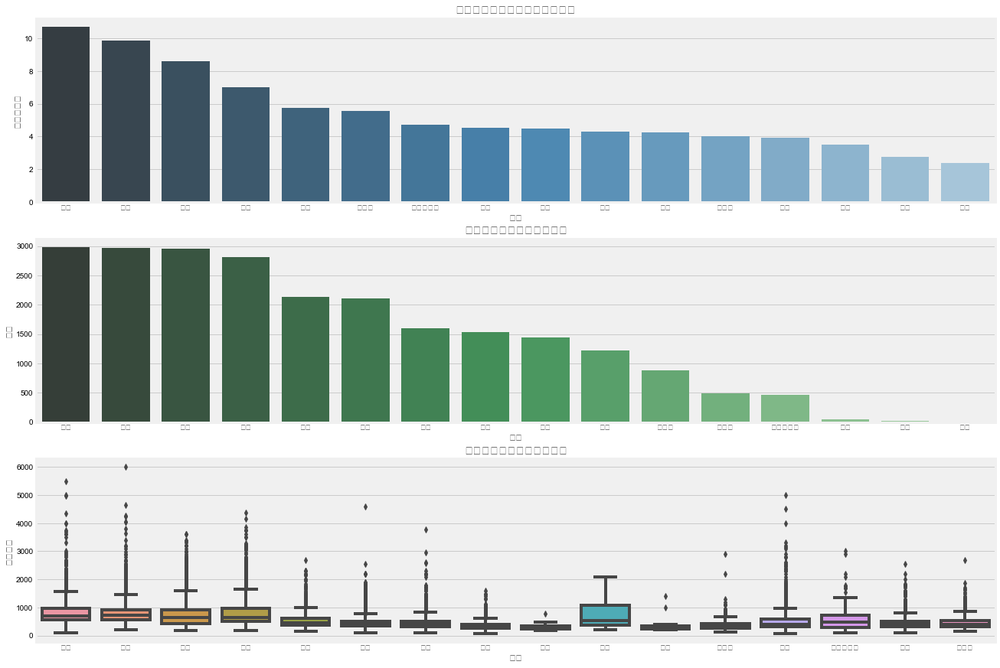

In [23]:
f, [ax1, ax2, ax3] = plt.subplots(3, 1, figsize=(20,15))
sns.barplot(x='Region', y='PerPrice', palette='Blues_d', data=df_house_mean, ax=ax1)
ax1.set_title('北京各区二手房每平米单价对比', fontsize=15)
ax1.set_xlabel('区域')
ax1.set_ylabel('每平米单价')

sns.barplot(x='Region', y='Price', palette="Greens_d", data=df_house_count, ax=ax2)
ax2.set_title('北京各大区二手房数量对比',fontsize=15)
ax2.set_xlabel('区域')
ax2.set_ylabel('数量')

sns.boxplot(x='Region', y='Price', data=df, ax=ax3)
ax3.set_title('北京各大区二手房房屋总价',fontsize=15)
ax3.set_xlabel('区域')
ax3.set_ylabel('房屋总价')
plt.show()

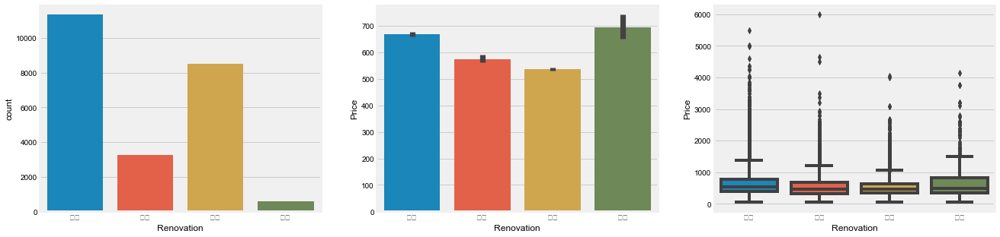

In [24]:
# Renovation 特征分析
df['Renovation'].value_counts()

f, [ax1, ax2, ax3] = plt.subplots(1, 3, figsize=(20,5))
sns.countplot(df['Renovation'], ax=ax1)
sns.barplot(x='Renovation', y='Price', data=df, ax=ax2)
sns.boxplot(x='Renovation', y='Price', data=df, ax=ax3)
plt.show()

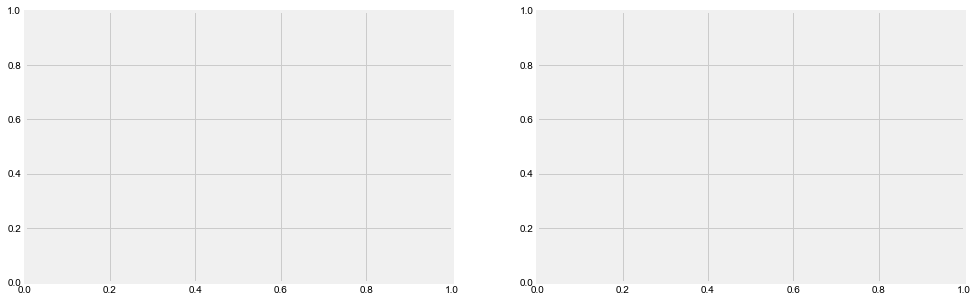

In [25]:
# Size特征分析
f, [ax1, ax2] = plt.subplots(1, 2, figsize=(15,5))

In [26]:
# 建房时间分布情况
sns.distplot(df['Size'], bins=20, ax=ax1, color='r')
sns.kdeplot(df['Size'], ax=ax1, shade=True)

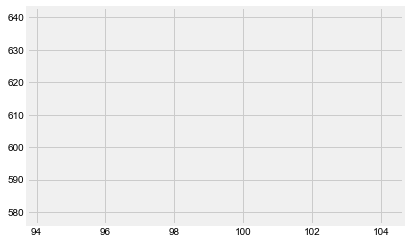

In [27]:
# 建房时间和出售价格的关系
sns.regplot(x='Size', y='Price', data=df, ax=ax2)
plt.show()

In [28]:
# 查看异常值
df.loc[df['Size'] < 10]
df.loc[df['Size'] > 1000]

,Region,District,Garden,Layout,Floor,Year,Size,Elevator,Direction,Renovation,PerPrice,Price


In [30]:
# 移除上述两种异常值
df = df[(df['Layout']!='叠拼别墅') & (df['Size']<1000)]
df.shape

(23656, 12)

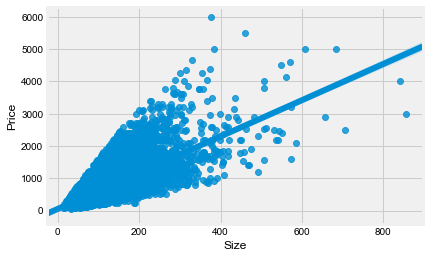

In [31]:
# 重新进行可视化发现就没有明显的异常点
sns.regplot(x='Size', y='Price', data=df)
plt.show()

d:\Anaconda3\lib\site-packages\seaborn\axisgrid.py:230: UserWarning: The `size` paramter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


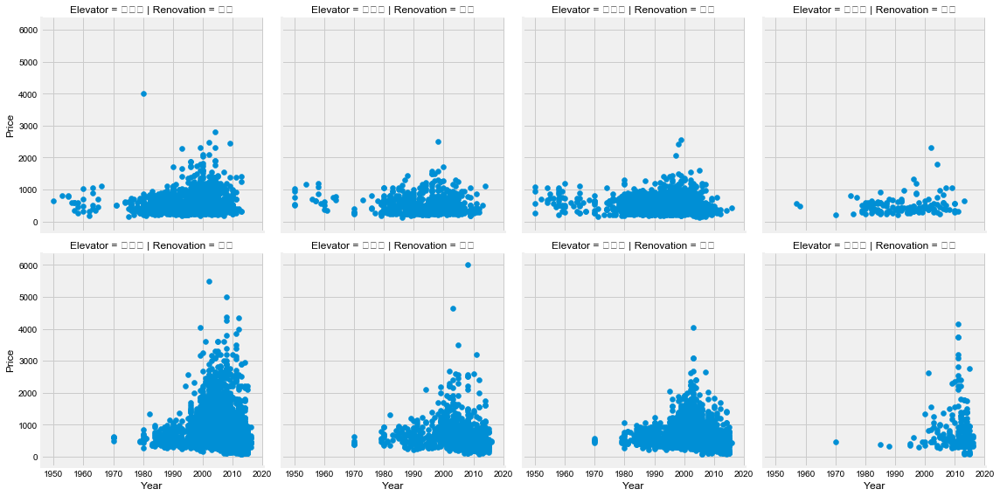

In [32]:
# Year 特征分析
grid = sns.FacetGrid(df, row='Elevator', col='Renovation', palette='seismic', size=4)
grid.map(plt.scatter, 'Year', 'Price')
# grid.add_legend()

In [33]:
df['Layout'].value_counts()

2室1厅      9485
3室1厅      3999
3室2厅      2765
1室1厅      2681
2室2厅      1671
4室2厅       930
1室0厅       499
4室1厅       295
5室2厅       200
2房间1卫      170
1房间1卫      146
3房间1卫      116
4室3厅        96
5室3厅        75
1室2厅        67
6室2厅        59
3房间2卫       53
2室0厅        50
3室3厅        43
4房间2卫       31
6室3厅        29
3室0厅        29
5室1厅        27
2房间2卫       18
4房间1卫       15
1房间0卫       14
5房间2卫       10
7室3厅         7
4房间3卫        7
5房间3卫        6
7室2厅         6
2室3厅         5
5室4厅         4
4室4厅         4
6室4厅         4
8室3厅         4
8室2厅         3
6房间4卫        3
3房间0卫        3
4室0厅         3
3房间3卫        2
2房间0卫        2
6室0厅         2
6房间3卫        2
1房间2卫        2
1室3厅         1
9室3厅         1
9室1厅         1
6室1厅         1
6室5厅         1
8室4厅         1
8室5厅         1
11房间3卫       1
5房间0卫        1
5室0厅         1
9室2厅         1
7房间2卫        1
6房间5卫        1
7室1厅         1
Name: Layout, dtype: int64

In [34]:
# 移除X房间X卫的格式 非民住
df = df.loc[(df['Layout'].str.extract('^\d(.*?)\d.*?') == '室')[0]]
df.head()

,Region,District,Garden,Layout,Floor,Year,Size,Elevator,Direction,Renovation,PerPrice,Price
0,东城,灯市口,锡拉胡同21号院,3室1厅,6,1988,75.0,NaN,东西,精装,10.400000,780.0
1,东城,东单,东华门大街,2室1厅,6,1988,60.0,无电梯,南北,精装,11.750000,705.0
2,东城,崇文门,新世界中心,3室1厅,16,1996,210.0,有电梯,南西,其他,6.666667,1400.0
3,东城,崇文门,兴隆都市馨园,1室1厅,7,2004,39.0,NaN,南,精装,10.769231,420.0
4,东城,陶然亭,中海紫御公馆,2室2厅,19,2010,90.0,有电梯,南,精装,11.088889,998.0


In [35]:
#这里我们对已有的 Layout 特征，Year 特征和 Direction 特征进行处理，创建新特征，删除无用特征，最后进行 One-hot 独热编码。
#处理 Layout 特征
# 用 str.extract() 方法，将"室"和"厅"都提取出来，单独作为两个新特征
df['Layout_room_num'] = df['Layout'].str.extract('(^\d).*', expand=False).astype('int64')
df['Layout_hall_num'] = df['Layout'].str.extract('^\d.*?(\d).*', expand=False).astype('int64')


In [36]:
# 将连续数值型特征 Year 离散化，做分箱处理
# 如何分箱还要看实际业务需求，这里为了方便，使用了pandas的 qcut 采用中位数进行分割，分割数为8等份
df['Year'] = pd.qcut(df['Year'], 8).astype('object')

df['Year'].value_counts()

df['Direction'].value_counts()

南北        11367
南          2726
东西         1388
东南         1311
西南         1094
东           843
西           802
西北          733
东北          645
北           484
东南北         465
南西北         370
南西          158
东西北         139
东南西         133
西南北         124
东南西北         90
西南东北         23
南东北          19
东南西南         15
东南南          13
东东南          10
西南西北         10
西东北          10
南西南           9
东西南           9
东南东北          7
东南南北          5
西南西           5
南西东北          3
东西南北          3
南西西北          2
南东            2
东北东北          2
西西北           2
西西南           2
东东北           2
南西南北          2
西北东北          2
南西北北          2
西北北           2
南西南西          2
南北东           1
东南北西          1
东东南南          1
东南西南北         1
西南西北东北        1
北西            1
东南西北东北        1
西南西北北         1
南北东北          1
北南            1
东西北北          1
东西东北          1
东西北东北         1
东南南西北         1
东南西南东北        1
东南西北北         1
南北西           1
Name: Direction, dtype: int64

In [37]:

# 写函数 direct_func 来整理上面较乱的 Direction
def direct_func(x):
    if not isinstance(x,str):
        raise TypeError
    x = x.strip()
    x_len = len(x)
    x_list = pd.unique([y for y in x])
    if x_len != len(x_list):
        return 'no'
        
    if (x_len == 2) & (x not in d_list_two):
        m0 = x[0]
        m1 = x[1]
        return m1+m0
    elif (x_len == 3) & (x not in d_list_three):
        for n in d_list_three:
            if (x_list[0] in n) & (x_list[1] in n) & (x_list[2] in n):
                return n
    elif (x_len == 4) & (x not in d_list_four):
        return d_list_four[0]
    else:
        return x

In [38]:
# 通过 apply() 方法将 Direction 数据格式转换
d_list_one = ['东','西','南','北']
d_list_two = ['东西','东南','东北','西南','西北','南北']
d_list_three = ['东西南','东西北','东南北','西南北']
d_list_four = ['东西南北']    
df['Direction'] = df['Direction'].apply(direct_func)
df = df.loc[(df['Direction']!='no')&(df['Direction']!='nan')]

df['Direction'].value_counts()

南北      11368
南        2726
东西       1388
东南       1313
西南       1252
东         843
西         802
西北        734
东北        645
西南北       495
东南北       485
北         484
东西北       149
东西南       142
东西南北      120
Name: Direction, dtype: int64

In [39]:
# 根据对业务的理解，定义新特征，然后观察这些新特征对模型有什么影响

In [40]:
# 根据已有特征创建新特征
df['Layout_total_num'] = df['Layout_room_num'] + df['Layout_hall_num']
df['Size_room_ratio'] = df['Size']/df['Layout_total_num'] 

df = df.drop(['Layout','PerPrice','Garden', 'District'], axis=1)

df.head()

,Region,Floor,Year,Size,Elevator,Direction,Renovation,Price,Layout_room_num,Layout_hall_num,Layout_total_num,Size_room_ratio
0,东城,6,"(1949.999, 1990.0]",75.0,NaN,东西,精装,780.0,3,1,4,18.75
1,东城,6,"(1949.999, 1990.0]",60.0,无电梯,南北,精装,705.0,2,1,3,20.00
2,东城,16,"(1990.0, 1997.0]",210.0,有电梯,西南,其他,1400.0,3,1,4,52.50
3,东城,7,"(2003.0, 2004.0]",39.0,NaN,南,精装,420.0,1,1,2,19.50
4,东城,19,"(2007.0, 2010.0]",90.0,有电梯,南,精装,998.0,2,2,4,22.50


In [41]:
def one_hot_encoder(df, nan_as_category = True):
    original_columns = list(df.columns)
    categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns= categorical_columns, dummy_na= nan_as_category)
    new_columns = [c for c in df.columns if c not in original_columns]
    return df, new_columns

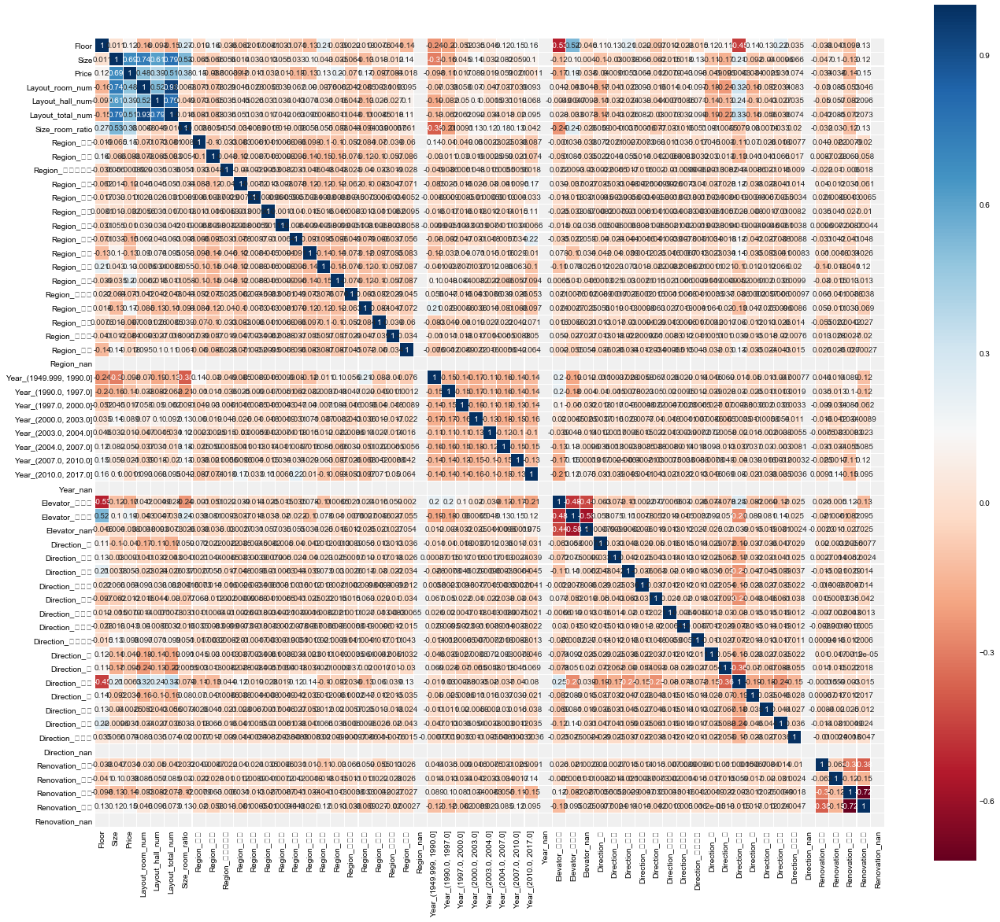

In [42]:
# 对于object特征进行onehot编码
df, df_cat = one_hot_encoder(df)

colormap = plt.cm.RdBu
plt.figure(figsize=(20, 20))
sns.heatmap(df.corr(), linewidth=0.1, vmax=1.0, square=True,
           cmap=colormap, linecolor='white', annot=True)

In [43]:
# 特征变量和目标变量
features = df.drop('Price', axis=1)
prices = df['Price']

In [44]:
# 把分类特征都转成数值型后有{}行{}列
print('北京二手房房价有数据 {0} 条，字段 {1} 个' .format(*df.shape))


北京二手房房价有数据 22946 条，字段 57 个


In [45]:
# 将数据集划分为训练集与测试集
features = np.array(features)
prices = np.array(prices)

In [46]:
# 导入 sklearn 进行训练测试集划分
from sklearn.model_selection import train_test_split
features_train, features_test, prices_train, prices_test = train_test_split(features, prices, test_size=0.2, random_state=0)


In [47]:
# 建立模型
from sklearn.model_selection import KFold
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import make_scorer
from sklearn.model_selection import GridSearchCV

In [48]:
# 通过交叉认证缓解数据集过拟合的现象
# 建立决策树回归模型
# 通过GridSearchCV找到最优深度参数（基于输入数据[X,y] 利于网格搜索找到最优的决策树模型）
def fit_model(X, y):
    
    cross_validator = KFold(10, shuffle=True)
    regressor = DecisionTreeRegressor()
    params = {'max_depth': [1,2,3,4,5,6,7,8,9,10]}
    scoring_fnc = make_scorer(performance_metric)
    grid = GridSearchCV(estimator=regressor, param_grid=params, scoring=scoring_fnc, cv=cross_validator)
    
    # 网格搜索
    grid = grid.fit(X, y)
    return grid.best_estimator_

In [49]:
# 计算 R2 分数
from sklearn.metrics import r2_score

def performance_metric(y_true, y_predict):
    score = r2_score(y_true, y_predict)
    
    return score

In [50]:
# 调参优化模型
# 通过可视化模型学习曲线，观察是否出现过拟合问题
# visuals 为自定义函数
import visuals as vs

# 分析模型
vs.ModelLearning(features_train, prices_train)
vs.ModelComplexity(features_train, prices_train)
optimal = fit_model(features_train, prices_train)

ModuleNotFoundError: No module named 'visuals'

In [51]:
# 输出最优模型的参数 'max_depth'
print('最优模型的参数 max_depth 是: {} ' .format(optimal.get_params()['max_depth']))

predicted_value = optimal.predict(features_test)
r2 = performance_metric(prices_test, predicted_value)


NameError: name 'optimal' is not defined

In [52]:
# 每次交叉验证得到的数据集不同，因此每次运行的结果也不一定相同
print('最优模型在测试数据上 R^2 分数 {: .2f}' .format(r2))


NameError: name 'r2' is not defined